# Vytváření heatmap

In [1]:
import pandas as pd
import os
import re
from datetime import datetime, timedelta
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
from visualize.image_points import *
from visualize.read_positions import read_positions
from visualize.perspective import *
import random
%matplotlib inline
import random
from visualize.helper import *
from visualize.layout import *
from visualize.heatmap import *


#### Pozice kamer

Upravené obrázky z https://www.zoopraha.cz/multimedia/prenos-z-udoli-slonu-zive

Vnitřek             |  Vnějšek
:-------------------------:|:-------------------------:
![](visualize/maps/zoo_inside.png)  |  ![](visualize/maps/zoo_outside.png)



#### Perspektivní transformace bounding boxů do 2D

/Users/tomasnguyen/FIT/BP/implementation/visualize/perspective.py:119: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_proj = pd.concat([df_proj, pd.DataFrame([data])], ignore_index=True)


True

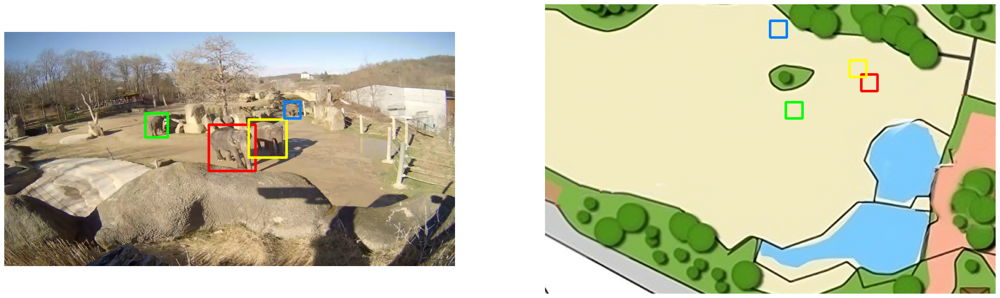

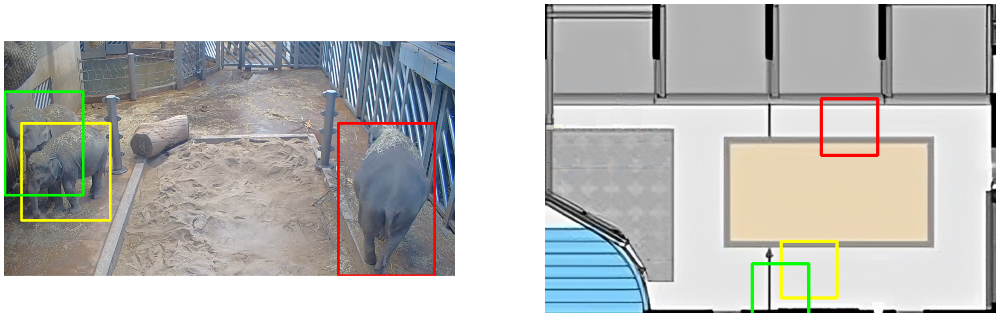

In [2]:
colors = [(0, 0, 255), (0, 255, 255), (0, 255, 0), (255, 128, 0)]

def show_all_boxes(img, width, height, df_tmp, colors, thickness=10):
    df_tmp.reset_index(inplace=True)
    for index, row in df_tmp.iterrows():
        cx, cy, w, h = row['X_center'] * width, row['Y_center'] * height, row['Width'] * width, row['Height'] * height
        plot_rectangle_on_image(img, cx, cy, w, h, colors[index], thickness)

df_tmp = read_positions(label_dir='visualize/showcase_data/labels', output_csv='visualize/showcase_data/pos.csv')
df_tmp_proj = project_df(df_tmp)
img = cv2.imread('visualize/showcase_data/screenshot6_24_02__10_45.png')
show_all_boxes(img, IMG_WIDTH, IMG_HEIGHT, df_tmp[df_tmp['Camera'] == 6], colors)
img_map = cv2.imread('visualize/maps/map6_fixed.png')
show_all_boxes(img_map, CAMERA_to_MAP[6][0], CAMERA_to_MAP[6][1], df_tmp_proj[df_tmp_proj['Camera'] == 6], colors, 4 )

plot_images(img, img_map)
cv2.imwrite('back6_boxes.png', img)
cv2.imwrite('map6_boxes.png', img_map)

img = cv2.imread('visualize/showcase_data/screenshot1_05_02__15_45.png')
show_all_boxes(img, IMG_WIDTH, IMG_HEIGHT, df_tmp[df_tmp['Camera'] == 1], colors)
img_map = cv2.imread('visualize/maps/map12.png')
show_all_boxes(img_map, CAMERA_to_MAP[1][0], CAMERA_to_MAP[1][1], df_tmp_proj[df_tmp_proj['Camera'] == 1], colors, 4)

plot_images(img, img_map)
cv2.imwrite('back1_boxes.png', img)
cv2.imwrite('map1_boxes.png', img_map)

#### Načtení všech anotací do Dataframu

In [3]:
df = read_positions(label_dir='../data_all/labels', output_csv='visualize/positions.csv')
target_date = pd.to_datetime('2024-01-21').date() 
df = df[df['Date'].dt.date != target_date] # Ignore first incomplete day
df.head(11)
date_diff = (df['Date'].max() - df['Date'].min()).days

df.head()

,Camera,Date,X_center,Y_center,Width,Height
0,1,2024-02-21 04:00:00,0.747396,0.2825,0.223958,0.361
1,1,2024-02-21 04:00:00,0.327604,0.8415,0.206250,0.301
2,7,2024-02-23 00:30:00,0.459896,0.7475,0.236458,0.469
3,2,2024-02-09 15:30:00,0.835677,0.5505,0.207813,0.405
4,2,2024-02-09 15:30:00,0.644531,0.3980,0.180729,0.408


In [4]:
df_proj = project_df(df) #### Perspective transform
print(f'LEN = {len(df_proj)}')
df_proj.head()
# df_proj['Camera'].value_counts()

/Users/tomasnguyen/FIT/BP/implementation/visualize/perspective.py:119: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_proj = pd.concat([df_proj, pd.DataFrame([data])], ignore_index=True)


LEN = 8045


,Camera,Date,X_center,Y_center,Width,Height
0,1,2024-02-21 04:00:00,0.404596,0.376043,0.125000,0.182447
1,1,2024-02-21 04:00:00,0.688206,0.699921,0.125000,0.182447
2,7,2024-02-23 00:30:00,0.379055,0.589405,0.138889,0.180260
3,2,2024-02-09 15:30:00,0.520134,0.869245,0.125000,0.182447
4,2,2024-02-09 15:30:00,0.674388,0.837020,0.125000,0.182447


### Ukázka jednotlivých heatmap

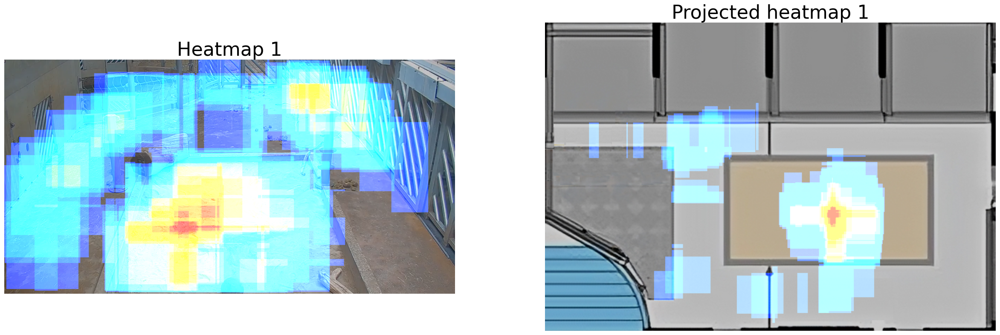

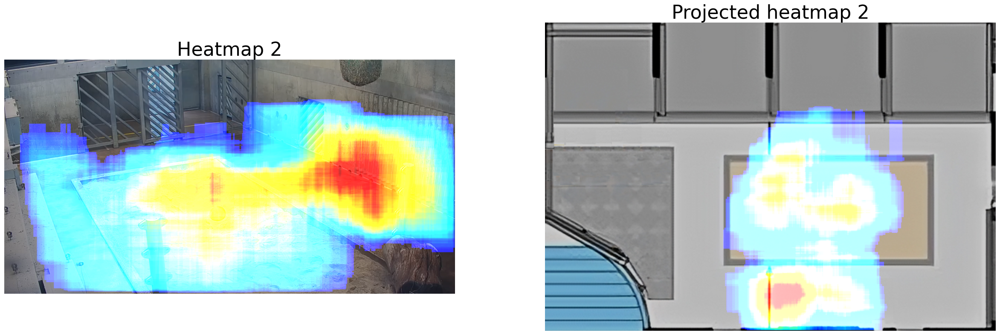

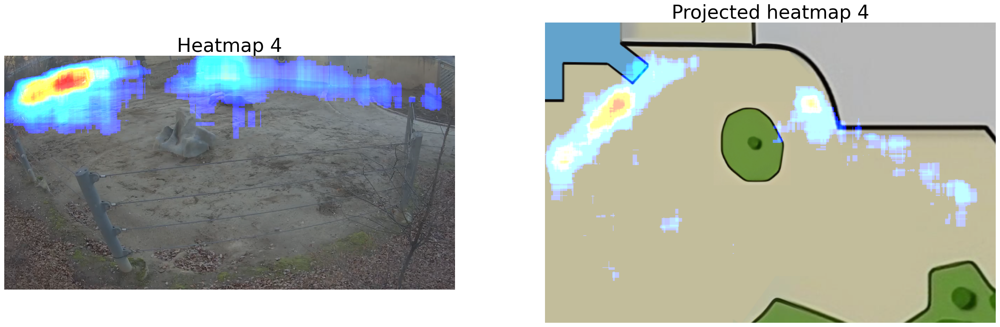

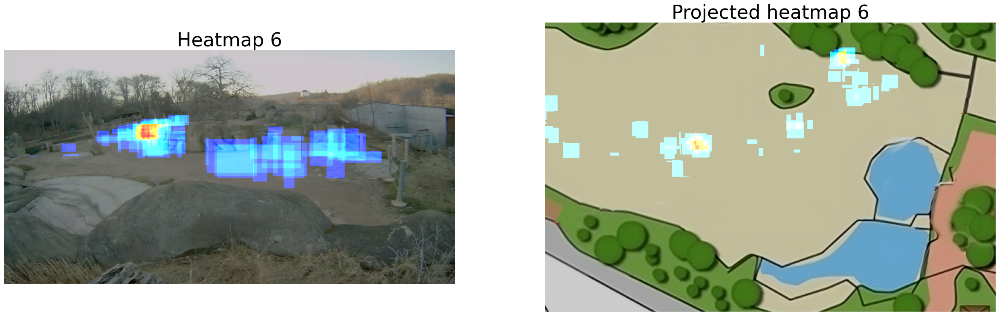

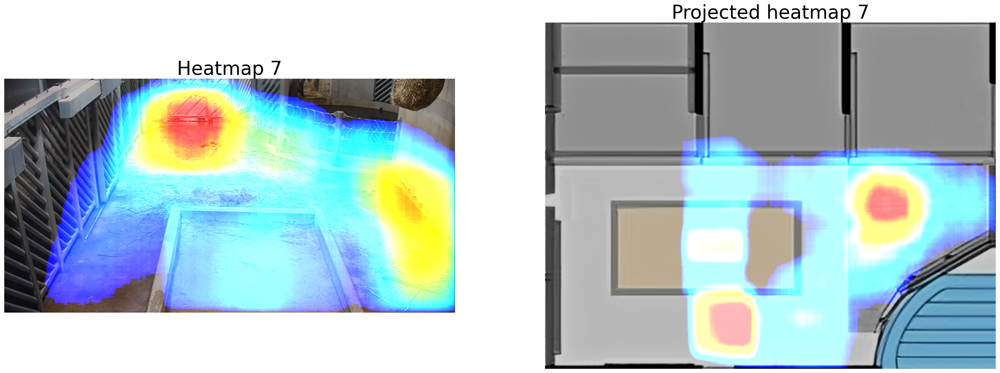

In [5]:
CAMERA_NUMS = [1, 2, 4, 6, 7]
CAMERA_TO_BOUND = {1:480, 2:900, 4: len(df), 6:1100, 7: len(df)}

for camera_num in CAMERA_NUMS:
    bound = CAMERA_TO_BOUND[camera_num]
    
    heatmap = one_heatmap_raw(df[:bound], [camera_num], 8)
    projected_heatmap = one_heatmap(df_proj[:bound], [camera_num], 8)
    # heatmap = resize_to_match_height(heatmap, projected_heatmap)
    plot_images(heatmap, projected_heatmap, titles=[f'Heatmap {camera_num}', f'Projected heatmap {camera_num}'], height=40)




### Ukázka všech heatmap po hodinách

In [6]:
df_proj = remove_duplicate_elephants(df_proj) 

Heatmaps already cached.


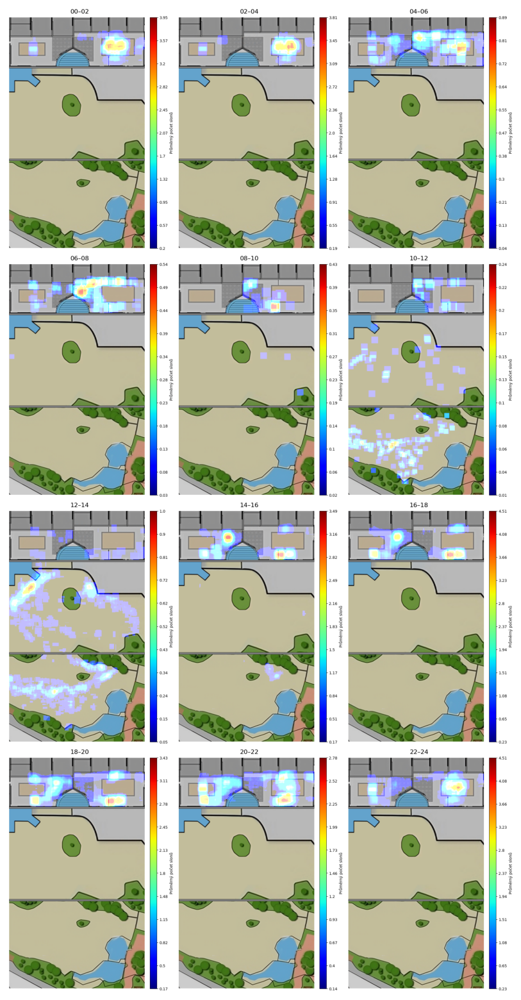

In [7]:

HOUR_SAMPLING = 2 # DO ONLY DIVISORS OF 24
heatmap_by_hour(df_proj=df_proj, hour_sampling=HOUR_SAMPLING, days_interval=date_diff+1)

Heatmaps already cached.


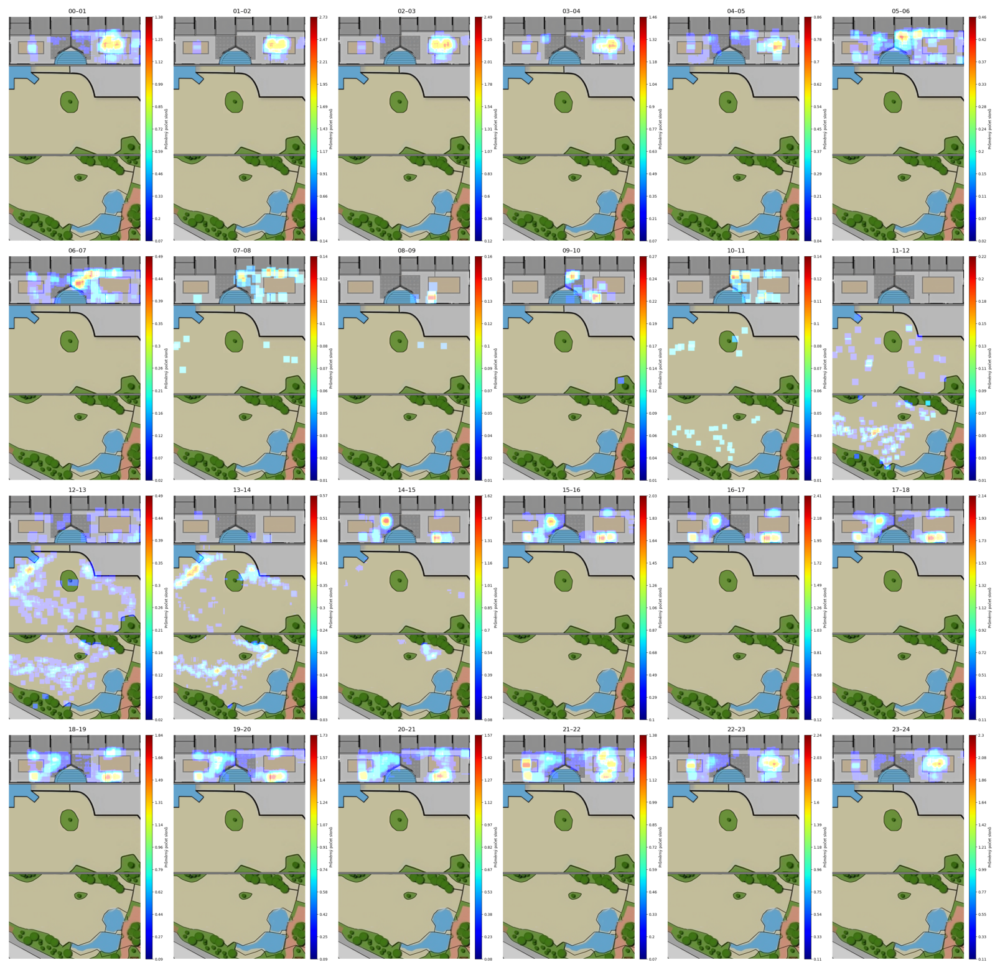

In [8]:
HOUR_SAMPLING = 1 # DO ONLY DIVISORS OF 24
heatmap_by_hour(df_proj=df_proj, hour_sampling=HOUR_SAMPLING, days_interval=date_diff+1)